In [2]:
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Detections Visualisation

## Key Takeaways


*   Other than transit and radial velociy, very few of the discovery methods are relevant

*   The "Transit Timing Variations" detection method was not disaggregated in the detections data

*    Histograms are number of positive detections

*    Stacked histogram without transit also has insights

*    Detection Method vs. Other Categories, like discovery telescope, could have been insightful, but nothing jumped out

In [1]:
from modules.detections import Detections
d = Detections('data/NASA_planetary_data.csv')

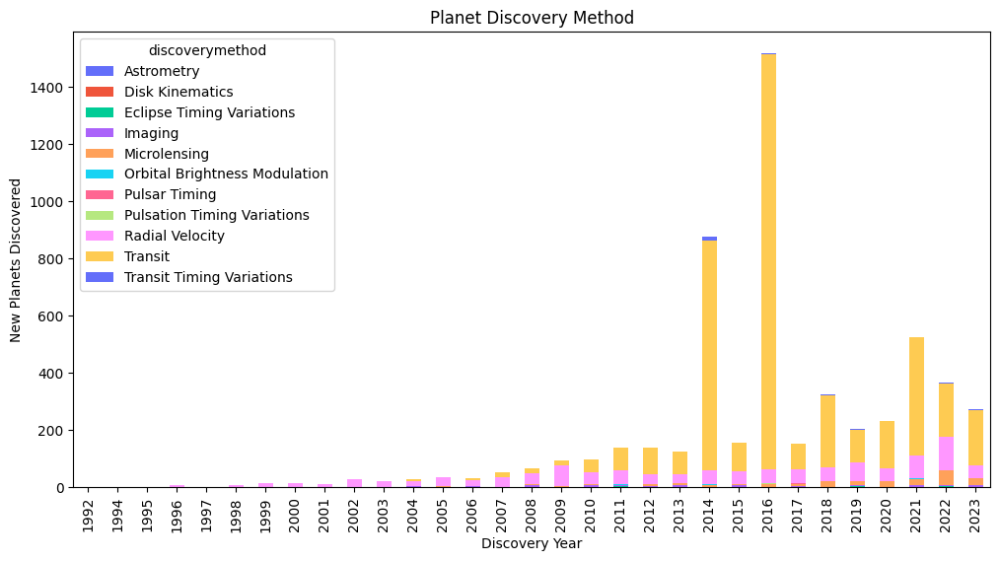

In [2]:
d.detection_vis_combined().show()

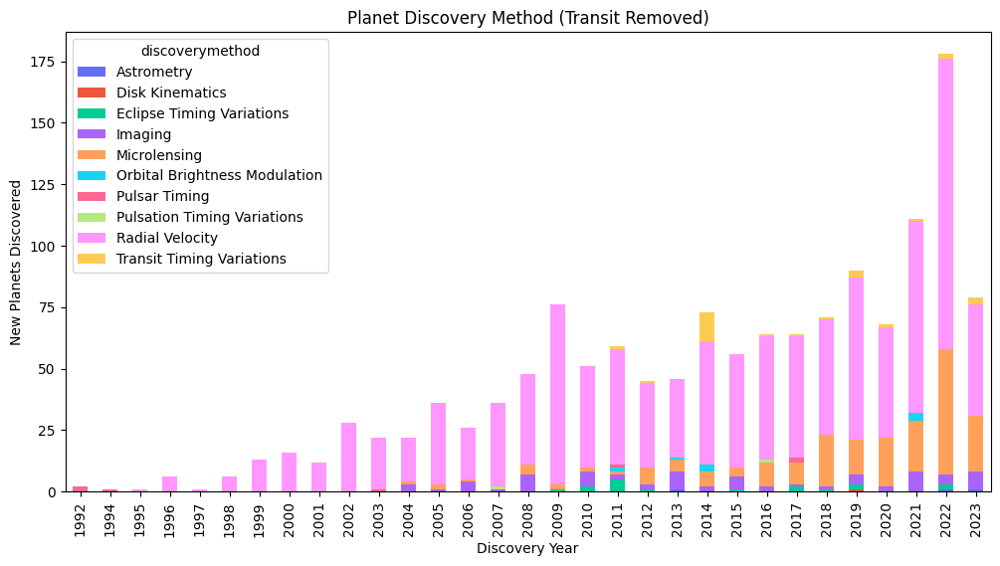

In [3]:
d.detection_vis_combined(remove_transit=True).show()

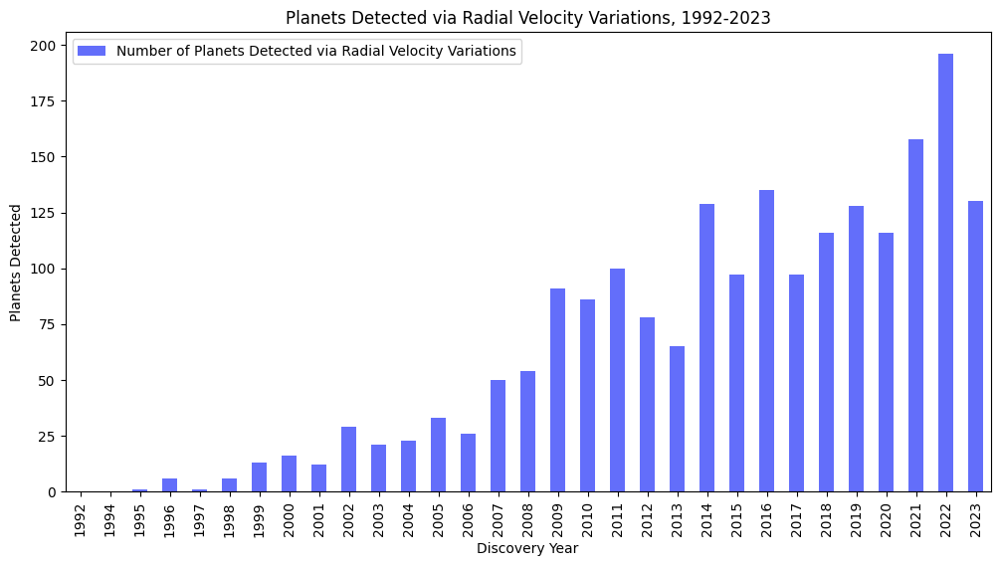

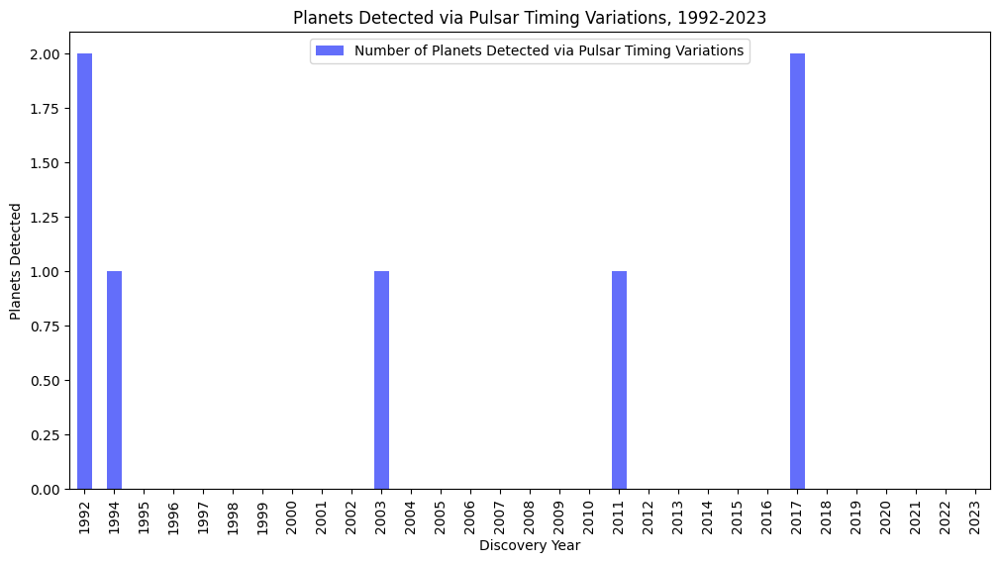

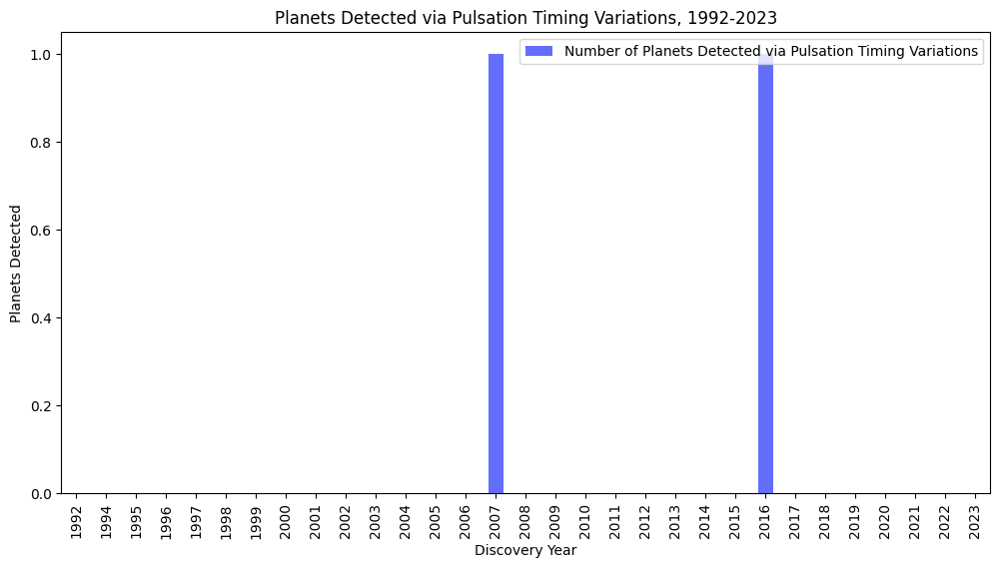

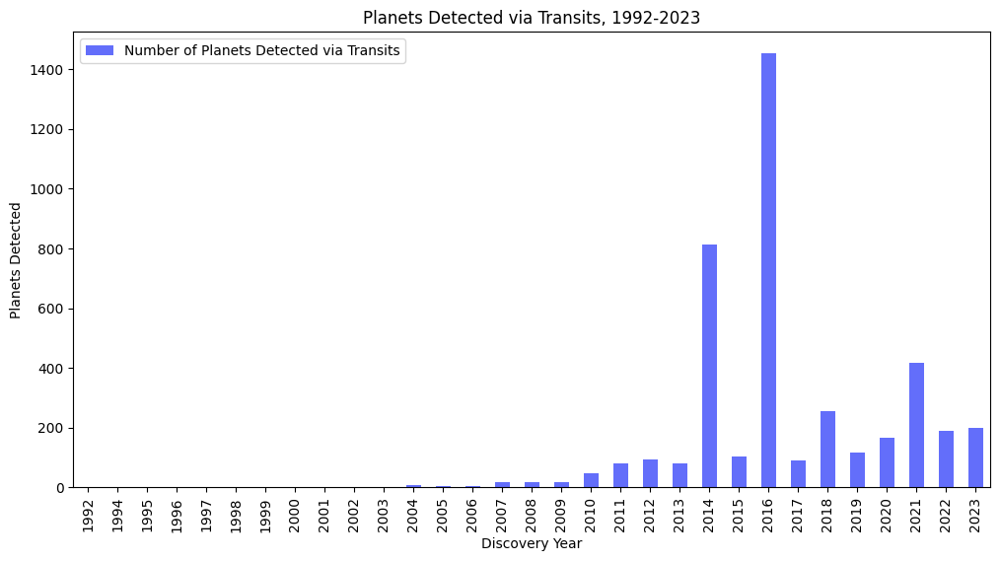

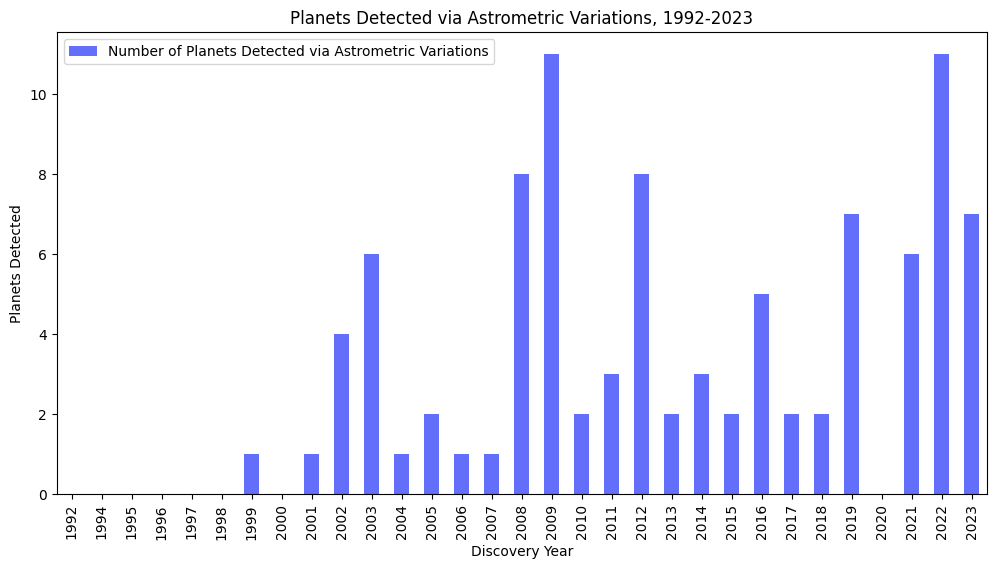

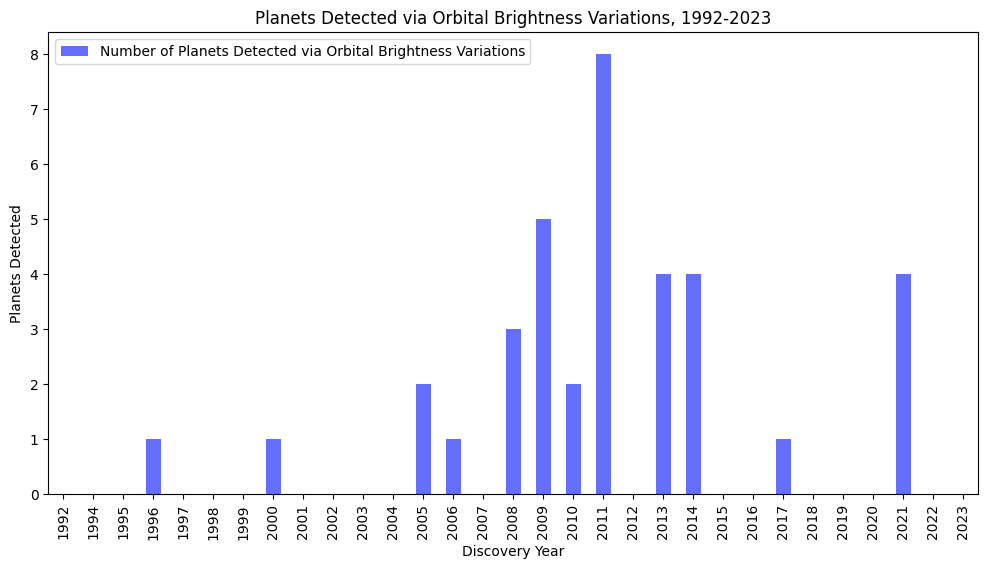

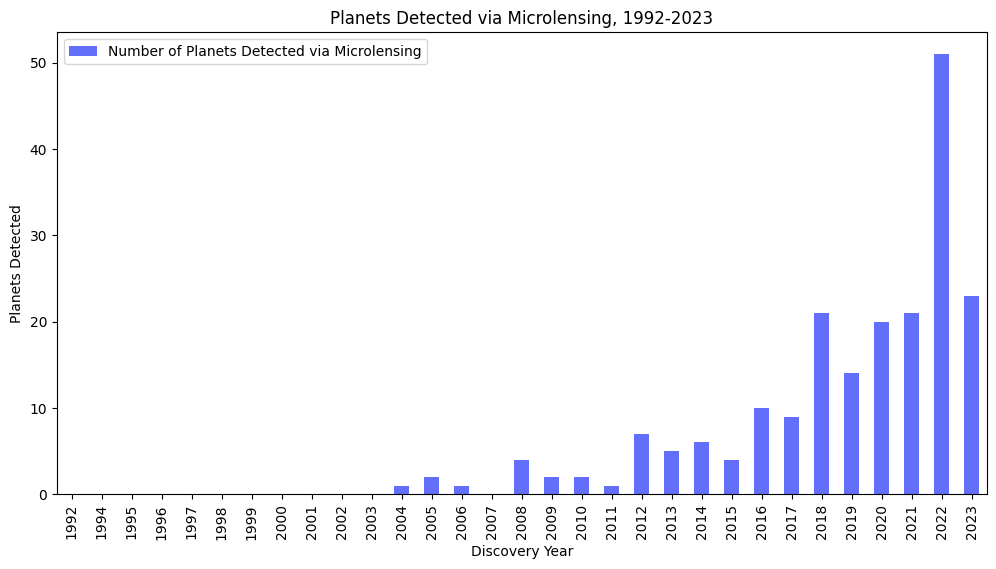

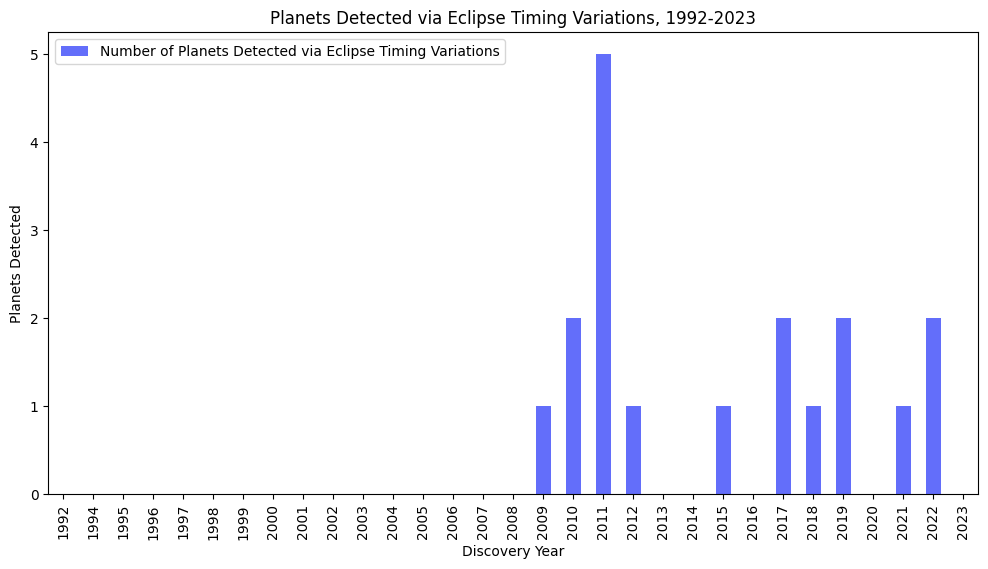

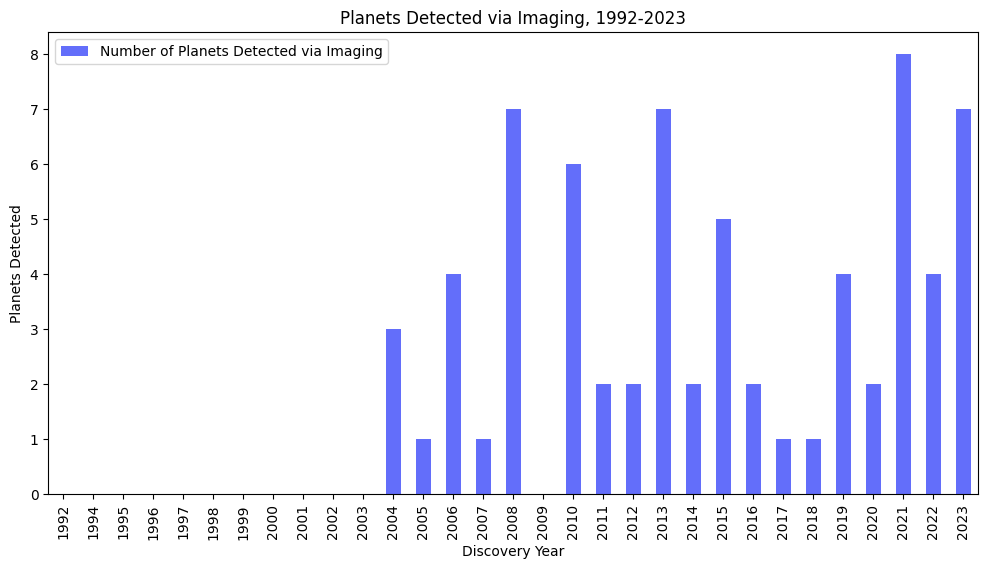

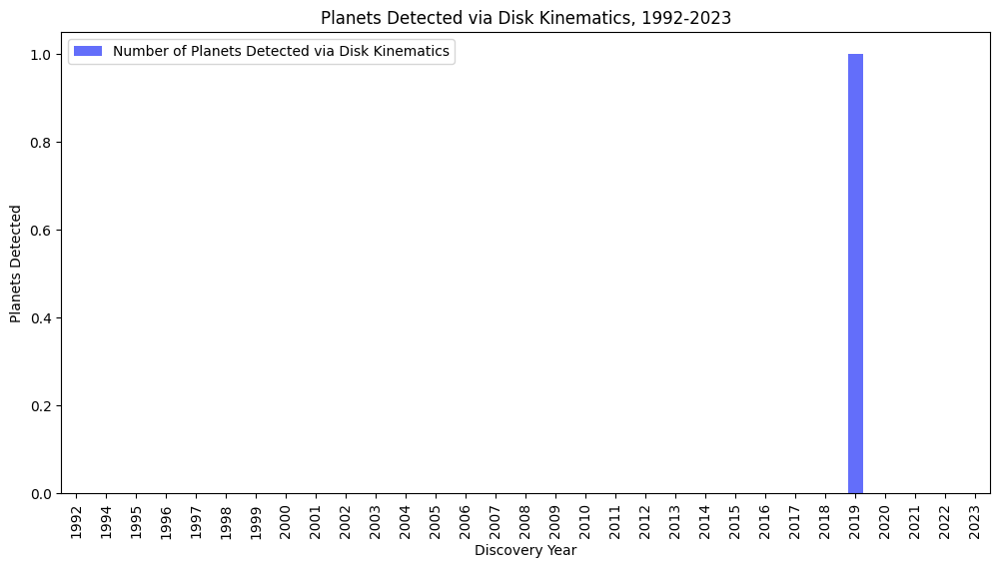

In [4]:
plot_list = d.detection_vis_separate()
for p in plot_list:
    p.show()

# Planet Visualisation 

In [14]:
from modules.planet_viz import Planet_Viz
pv = Planet_Viz('data/NASA_planetary_data.csv')

In [15]:
pv.interative_planet_viz()

In [16]:
pv.equivolume_bins_histogram()

In [17]:
pv.planet_yr_method_dist()

In [18]:
pv.planet_yr_method_hist()

# Setting up

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go


Make sure you made a shortcut of the folder in your drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
df = pd.read_csv('/content/gdrive/MyDrive/ECE 143 Group 18 Project/NASA_planetary_data.csv', skiprows=168)

In [ ]:
df.head()

,rowid,pl_name,hostname,pl_letter,hd_name,hip_name,tic_id,gaia_id,sy_snum,sy_pnum,...,sy_tmag,sy_tmag_reflink,sy_kepmag,sy_kepmag_reflink,pl_nnotes,st_nphot,st_nrvc,st_nspec,pl_nespec,pl_ntranspec
0,1,11 Com b,11 Com,b,HD 107383,HIP 60202,TIC 72437047,Gaia DR2 3946945413106333696,2,1,...,3.83790,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,2.0,1,2,0,0,0
1,2,11 UMi b,11 UMi,b,HD 136726,HIP 74793,TIC 230061010,Gaia DR2 1696798367260229376,1,1,...,3.82294,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,0.0,1,1,0,0,0
2,3,14 And b,14 And,b,HD 221345,HIP 116076,TIC 333225860,Gaia DR2 1920113512486282240,1,1,...,4.32140,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,0.0,1,1,0,0,0
3,4,14 Her b,14 Her,b,HD 145675,HIP 79248,TIC 219483057,Gaia DR2 1385293808145621504,1,2,...,5.86310,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,0.0,1,4,1,0,0
4,5,16 Cyg B b,16 Cyg B,b,HD 186427,HIP 96901,TIC 27533327,Gaia DR2 2135550755683407232,3,1,...,5.62810,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,6.095,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,5.0,1,4,3,0,0


In [ ]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="my application")
location = geolocator.geocode("Xinglong Station")
print(location.address)
print((location.latitude, location.longitude))

兴隆, G321;S438, 叙永县, 泸州市, 四川省, 646400, 中国
(28.2993048, 105.3761434)


In [ ]:
df_mod = df[df.disc_locale == 'Ground']
df_mod = df_mod[df_mod.disc_facility != None]
df_mod = df_mod[df_mod.disc_facility != 'Multiple Observatories']
df_mod = df_mod[df_mod.disc_facility != 'Multiple Facilities']

KeyboardInterrupt: ignored

# example code of planet discovery map

In [ ]:
import plotly.express as px
import pandas as pd
from geopy.geocoders import Nominatim

def get_coordinates(location_name):
    geolocator = Nominatim(user_agent="my_geocoder")
    location = geolocator.geocode(location_name)

    if location:
        return location.latitude, location.longitude
    else:
        return None

# Example dataset (replace with your actual dataset)
data = {
    'Planet': ['Earth', 'Mars', 'Venus'],
    'Discovery Facility': ['Yunnan Astronomical Observatory', 'Xinglong Station', 'Okayama Astrophysical Observatory'],
    'Discovery Locale': ['Ground', 'Ground', 'Ground'],
}

df = df_mod
df = df.rename({'disc_facility': 'Discovery Facility', 'disc_locale' : 'Discovery Locale'}, axis='columns')

# Filter the dataset for facilities on the ground
ground_facilities = df[df['Discovery Locale'] == 'Ground'].copy()



# Create a new DataFrame to store coordinates
coordinates_df = pd.DataFrame(ground_facilities['Discovery Facility'].apply(get_coordinates).tolist(), columns=['Latitude', 'Longitude'])

# Merge the coordinates DataFrame with the ground facilities DataFrame
ground_facilities = pd.concat([ground_facilities, coordinates_df], axis=1)

# Check for missing coordinates and print the names of facilities with missing coordinates
missing_coordinates = ground_facilities[ground_facilities['Latitude'].isnull() | ground_facilities['Longitude'].isnull()]
if not missing_coordinates.empty:
    print(f"Warning: Coordinates not found for the following facilities:\n{missing_coordinates['Discovery Facility'].tolist()}")

# Remove rows with missing coordinates
ground_facilities = ground_facilities.dropna(subset=['Latitude', 'Longitude'])

# Plot the scatter map using Plotly Express
fig = px.scatter_geo(
    ground_facilities,
    lat='Latitude',
    lon='Longitude',
    title='Discovery Facilities on the Ground',
    projection='natural earth',
)

# Show the plot
fig.show()

KeyboardInterrupt: ignored

In [ ]:
# Plot the scatter map with hover text using Plotly Express
fig = px.scatter_geo(
    ground_facilities,
    lat='Latitude',
    lon='Longitude',
    hover_name='Discovery Facility',  # Specify the column for hover text
    title='Discovery Facilities on the Ground',
    projection='natural earth',
)

# Facility & Locate

In [ ]:
df.columns.tolist()[:21]

['rowid',
 'pl_name',
 'hostname',
 'pl_letter',
 'hd_name',
 'hip_name',
 'tic_id',
 'gaia_id',
 'sy_snum',
 'sy_pnum',
 'sy_mnum',
 'cb_flag',
 'discoverymethod',
 'disc_year',
 'disc_refname',
 'disc_pubdate',
 'disc_locale',
 'disc_facility',
 'disc_telescope',
 'disc_instrument',
 'rv_flag']

In [ ]:
df_new = df[['pl_name',
 'discoverymethod',
 'disc_year',
 'disc_locale',
 'disc_facility',
 'disc_telescope',
 'disc_instrument']].copy()

In [ ]:
df_new.head()

,pl_name,discoverymethod,disc_year,disc_locale,disc_facility,disc_telescope,disc_instrument
0,11 Com b,Radial Velocity,2007,Ground,Xinglong Station,2.16 m Telescope,Coude Echelle Spectrograph
1,11 UMi b,Radial Velocity,2009,Ground,Thueringer Landessternwarte Tautenburg,2.0 m Alfred Jensch Telescope,Coude Echelle Spectrograph
2,14 And b,Radial Velocity,2008,Ground,Okayama Astrophysical Observatory,1.88 m Telescope,HIDES Echelle Spectrograph
3,14 Her b,Radial Velocity,2002,Ground,W. M. Keck Observatory,10 m Keck I Telescope,HIRES Spectrometer
4,16 Cyg B b,Radial Velocity,1996,Ground,Multiple Observatories,Multiple Telescopes,Multiple Instruments


In [ ]:
df_new['disc_locale'] = df_new['disc_locale'].replace('Multiple Locale', 'Multiple Locales')

## Locale & Facility

In [ ]:
df_mod = df_new['disc_facility'].value_counts()
df_mod_fin = df_new[df_new.disc_facility.isin(list(df_mod[df_mod > 50].index))]

In [ ]:
# Plot count of disc_locale
fig1 = px.bar(df_new['disc_locale'].value_counts().reset_index(), x='index', y='disc_locale',
              labels={'index': 'Discovery Locale', 'disc_locale': 'Count'},
              title='Count of Discovery Locale', template = 'plotly_dark')
# Increase the size of x-axis label
fig1.update_layout(xaxis=dict(tickfont=dict(size=18)))
fig1.show()

df_new['disc_facility'].value_counts()

# Plot count of disc_facility
fig2 = px.bar(df_mod_fin['disc_facility'].value_counts().reset_index(), x='index', y='disc_facility',
              labels={'index': 'Discovery Facility', 'disc_facility': 'Count'},
              title='Count of Discovery Facility with > 50 counts', template = 'plotly_dark')
fig2.show()

In [ ]:
# Create a DataFrame to count the number of different locales for each facility
facility_locale_count = df_new.groupby('disc_facility')['disc_locale'].nunique().reset_index()

# Plot the number of different locales for each facility
fig = px.bar(facility_locale_count, x='disc_facility', y='disc_locale',
             labels={'disc_facility': 'Discovery Facility', 'disc_locale': 'Number of Different Locales'},
             title='Number of Different Locales for Each Facility', template = 'plotly_dark')
fig.show()

In [ ]:
# Create a DataFrame to count occurrences of each locale for each facility
facility_locale_count = df_new.groupby(['disc_facility', 'disc_locale']).size().reset_index(name='count')

# Plot different locales for each facility
fig = px.bar(facility_locale_count, x='disc_facility', y='count', color='disc_locale',
             labels={'disc_facility': 'Discovery Facility', 'count': 'Count'},
             title='Different Locales for Each Facility',
             hover_name='disc_locale', template = 'plotly_dark')
fig.show()

## Year & Locale

In [ ]:
# Create a scatter plot
fig = px.scatter(df_new, x='disc_year', y='disc_locale', color='disc_locale',
                 labels={'disc_year': 'Discovery Year', 'disc_locale': 'Discovery Locale'},
                 title='Relationship between Discovery Year and Locale', template = 'plotly_dark')
fig.update_traces(marker=dict(size=10))  # Adjust the size as needed
# Increase the size of y-axis labels
fig.update_layout(yaxis=dict(tickfont=dict(size=18)))  # Adjust the size as needed

fig.show()

## ('locale', 'facility') X ('discoverymethod', 'disc_telescope', 'disc_instrument')
2 x 3

In [ ]:
# ('disc_locale', 'discoverymethod')

# Count the occurrences of each 'discoverymethod' for each 'disc_locale'
count_data = df_new.groupby(['disc_locale', 'discoverymethod']).size().reset_index(name='count')

# Create a bar plot
fig = px.bar(count_data, x='disc_locale', y='count', color='discoverymethod',
             title='Count of Discovery Methods in Each Locale',
             labels={'disc_locale': 'Discovery Locale', 'count': 'Count', 'discoverymethod': 'Discovery Method'}, template = 'plotly_dark')

fig.show()

In [ ]:
# ('disc_locale', 'disc_telescope'):

# Count the occurrences of each ('disc_locale', 'disc_telescope') combination
count_data = df_new.groupby(['disc_locale', 'disc_telescope']).size().reset_index(name='count')

# Create a bar plot
fig = px.bar(count_data, x='disc_locale', y='count', color='disc_telescope',
             title='Count of Telescopes in Each Locale',
             labels={'disc_locale': 'Locale', 'count': 'Count', 'disc_telescope': 'Telescope'}, template = 'plotly_dark')

locale_order = ['Ground', 'Space', 'Multiple Locales']
fig.update_layout(xaxis={'categoryorder':'array', 'categoryarray': locale_order})
fig.show()

In [ ]:
# ('disc_locale', 'disc_instrument'):

# Count the occurrences of each ('disc_locale', 'disc_instrument') combination
count_data = df_new.groupby(['disc_locale', 'disc_instrument']).size().reset_index(name='count')

# Create a bar plot
fig = px.bar(count_data, x='disc_locale', y='count', color='disc_instrument',
             title='Count of Instruments in Each Locale',
             labels={'disc_locale': 'Locale', 'count': 'Count', 'disc_instrument': 'Instrument'}, template = 'plotly_dark')
locale_order = ['Ground', 'Space', 'Multiple Locales']
fig.update_layout(xaxis={'categoryorder':'array', 'categoryarray': locale_order})
fig.show()

In [ ]:
# ('disc_facility', 'discoverymethod'):

# Count the occurrences of each ('disc_facility', 'discoverymethod') combination
count_data = df_new.groupby(['disc_facility', 'discoverymethod']).size().reset_index(name='count')

# Create a bar plot
fig = px.bar(count_data, x='disc_facility', y='count', color='discoverymethod',
             title='Count of Discovery Methods in Each Facility',
             labels={'disc_facility': 'Discovery Facility', 'count': 'Count', 'discoverymethod': 'Discovery Method'}, template = 'plotly_dark')
fig.show()

In [ ]:
# ('disc_facility', 'disc_telescope'):

# Count the occurrences of each ('disc_facility', 'disc_telescope') combination
count_data = df_new.groupby(['disc_facility', 'disc_telescope']).size().reset_index(name='count')

# Create a bar plot
fig = px.bar(count_data, x='disc_facility', y='count', color='disc_telescope',
             title='Count of Telescopes in Each Facility',
             labels={'disc_facility': 'Facility', 'count': 'Count', 'disc_telescope': 'Telescope'}, template = 'plotly_dark')
fig.show()

In [ ]:
# ('disc_facility', 'disc_instrument'):

# Count the occurrences of each ('disc_facility', 'disc_instrument') combination
count_data = df_new.groupby(['disc_facility', 'disc_instrument']).size().reset_index(name='count')

# Create a bar plot
fig = px.bar(count_data, x='disc_facility', y='count', color='disc_instrument',
             title='Count of Instruments in Each Facility',
             labels={'disc_facility': 'Facility', 'count': 'Count', 'disc_instrument': 'Instrument'}, template = 'plotly_dark')
fig.show()